In [1]:
# Initial Imports:
import pandas as pd
import numpy as np
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import plotly.express as px
import hvplot.pandas
import matplotlib.pyplot as plt
import seaborn as sns

# For Data Manipulation:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

# For Random Forest:
from sklearn.ensemble import RandomForestClassifier

# For Decision Tree:
from sklearn import tree
import pydotplus
from IPython.display import Image

# For K-Means Clustering:
from sklearn.cluster import KMeans

# For evaluation:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_recall_curve

# Data Pre-Processing:

In [2]:
# Read in CSV:
csvpath = Path('/Users/BenFischler/Desktop/stats_2015_2017.csv')
originaldf = pd.read_csv(csvpath)

# Set Pandas option to show all DataFrame columns (without showing truncated ... in middle):
pd.set_option('display.max_rows', None, 'display.max_columns', None)

# Preview original DataFrame:
originaldf.head(3)

,Unnamed: 0,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,FG,FGA,FGA/GAME,FG%,3P,3PA,3PA/GAME,3P%,2P,2PA,2PA/GAME,2P%,eFG%,FT,FTA,FTA/GAME,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PPG,APG,RPG,ORPG,SPG,BPG,FOULS/GAME,TOV/GAME
0,1,2015,Quincy Acy,PF,24,NYK,68,22,1287,11.9,0.533,0.181,0.293,6.9,20.5,13.5,8.7,1.1,1.4,13.8,15.5,1.0,0.7,1.7,0.063,-2.3,-0.8,-3.1,-0.3,152,331,4.867647,0.459,18,60,0.882353,0.3,134,271,3.985294,0.494,0.486,76,97,1.426471,0.784,79,222,301,68,27,22,60,147,398,5.852941,1.000000,4.426471,1.161765,0.397059,0.323529,2.161765,0.882353
1,2,2015,Jordan Adams,SG,20,MEM,30,0,248,12.8,0.489,0.291,0.267,4.2,8.7,6.4,10.1,3.4,2.3,12.7,20.4,0.0,0.4,0.4,0.073,-1.8,1.2,-0.6,0.1,35,86,2.866667,0.407,10,25,0.833333,0.4,25,61,2.033333,0.410,0.465,14,23,0.766667,0.609,9,19,28,16,16,7,14,24,94,3.133333,0.533333,0.933333,0.300000,0.533333,0.233333,0.800000,0.466667
2,3,2015,Steven Adams,C,21,OKC,70,67,1771,14.1,0.549,0.005,0.514,12.2,19.3,15.8,5.5,1.1,3.8,16.8,14.3,1.9,2.2,4.1,0.111,-1.4,1.8,0.4,1.1,217,399,5.700000,0.544,0,2,0.028571,0.0,217,397,5.671429,0.547,0.544,103,205,2.928571,0.502,199,324,523,66,38,86,99,222,537,7.671429,0.942857,7.471429,2.842857,0.542857,1.228571,3.171429,1.414286


In [3]:
# Create pre-conversion "shape" variable:
shape_pre_conversion = originaldf.shape

In [4]:
# Filter DataFrame to only include players with 2,460 minutes played (10 minutes/game average * 82 games/season * 3 seasons worth of data)
# Players with less than 2,460 minutes played will not have meaningful statistics that are truly representative of that position:

groupby_df = originaldf.groupby('Player').sum()

# Create new DataFrame, filtering above DataFrame by players who have over 2,460 Minutes Played:
new_original_df = groupby_df[groupby_df.MP >= 2460]
new_original_df = new_original_df.reset_index()

# Now, save over original DataFrame, using .isin() function to specify that we only want to include players that are in new_original_df, which
# is the DataFrame that contains only players with at least 2,460 minutes played:
originaldf = originaldf[originaldf.Player.isin(new_original_df.Player)]
originaldf.head()


,Unnamed: 0,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,FG,FGA,FGA/GAME,FG%,3P,3PA,3PA/GAME,3P%,2P,2PA,2PA/GAME,2P%,eFG%,FT,FTA,FTA/GAME,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PPG,APG,RPG,ORPG,SPG,BPG,FOULS/GAME,TOV/GAME
0,1,2015,Quincy Acy,PF,24,NYK,68,22,1287,11.9,0.533,0.181,0.293,6.9,20.5,13.5,8.7,1.1,1.4,13.8,15.5,1.0,0.7,1.7,0.063,-2.3,-0.8,-3.1,-0.3,152,331,4.867647,0.459,18,60,0.882353,0.300,134,271,3.985294,0.494,0.486,76,97,1.426471,0.784,79,222,301,68,27,22,60,147,398,5.852941,1.000000,4.426471,1.161765,0.397059,0.323529,2.161765,0.882353
2,3,2015,Steven Adams,C,21,OKC,70,67,1771,14.1,0.549,0.005,0.514,12.2,19.3,15.8,5.5,1.1,3.8,16.8,14.3,1.9,2.2,4.1,0.111,-1.4,1.8,0.4,1.1,217,399,5.700000,0.544,0,2,0.028571,0.000,217,397,5.671429,0.547,0.544,103,205,2.928571,0.502,199,324,523,66,38,86,99,222,537,7.671429,0.942857,7.471429,2.842857,0.542857,1.228571,3.171429,1.414286
4,5,2015,Arron Afflalo,SG,29,TOT,78,72,2502,10.7,0.533,0.377,0.224,1.1,9.7,5.3,8.2,0.8,0.2,10.7,19.0,1.6,1.0,2.6,0.050,-0.5,-1.3,-1.8,0.1,375,884,11.333333,0.424,118,333,4.269231,0.354,257,551,7.064103,0.466,0.491,167,198,2.538462,0.843,27,220,247,129,41,7,116,167,1035,13.269231,1.653846,3.166667,0.346154,0.525641,0.089744,2.141026,1.487179
5,6,2015,Arron Afflalo,SG,29,DEN,53,53,1750,11.7,0.533,0.370,0.230,1.3,10.2,5.6,9.3,0.9,0.2,10.3,19.9,1.4,0.4,1.8,0.050,0.0,-1.6,-1.6,0.2,281,657,12.396226,0.428,82,243,4.584906,0.337,199,414,7.811321,0.481,0.490,127,151,2.849057,0.841,21,159,180,101,32,5,83,108,771,14.547170,1.905660,3.396226,0.396226,0.603774,0.094340,2.037736,1.566038
6,7,2015,Arron Afflalo,SG,29,POR,25,19,752,8.2,0.533,0.396,0.207,0.9,8.5,4.8,5.5,0.6,0.2,11.8,16.7,0.2,0.5,0.8,0.049,-1.5,-0.8,-2.3,-0.1,94,227,9.080000,0.414,36,90,3.600000,0.400,58,137,5.480000,0.423,0.493,40,47,1.880000,0.851,6,61,67,28,9,2,33,59,264,10.560000,1.120000,2.680000,0.240000,0.360000,0.080000,2.360000,1.320000


In [5]:
shape_post_conversion = originaldf.shape

print(f'Shape Pre-Conversion: {shape_pre_conversion}')
print(f'Shape Post-Conversion: {shape_post_conversion}')

Shape Pre-Conversion: (1824, 63)
Shape Post-Conversion: (1163, 63)


In [6]:
# Slice original dataframe into new dataframe with relevant columns, while appropriately ordering columns:
df = originaldf[['PPG', 'RPG', 'ORPG', 'APG', 'SPG', 'BPG', 'FG%', 'FGA/GAME', 'TS%', '3PA/GAME', '3P%', '2PA/GAME', '2P%', 'FTA/GAME', 'FT%', 'FOULS/GAME', 'TOV/GAME', 'USG%', 'Pos']]

# Confirm New DataFrame:
df.head()

,PPG,RPG,ORPG,APG,SPG,BPG,FG%,FGA/GAME,TS%,3PA/GAME,3P%,2PA/GAME,2P%,FTA/GAME,FT%,FOULS/GAME,TOV/GAME,USG%,Pos
0,5.852941,4.426471,1.161765,1.000000,0.397059,0.323529,0.459,4.867647,0.533,0.882353,0.300,3.985294,0.494,1.426471,0.784,2.161765,0.882353,15.5,PF
2,7.671429,7.471429,2.842857,0.942857,0.542857,1.228571,0.544,5.700000,0.549,0.028571,0.000,5.671429,0.547,2.928571,0.502,3.171429,1.414286,14.3,C
4,13.269231,3.166667,0.346154,1.653846,0.525641,0.089744,0.424,11.333333,0.533,4.269231,0.354,7.064103,0.466,2.538462,0.843,2.141026,1.487179,19.0,SG
5,14.547170,3.396226,0.396226,1.905660,0.603774,0.094340,0.428,12.396226,0.533,4.584906,0.337,7.811321,0.481,2.849057,0.841,2.037736,1.566038,19.9,SG
6,10.560000,2.680000,0.240000,1.120000,0.360000,0.080000,0.414,9.080000,0.533,3.600000,0.400,5.480000,0.423,1.880000,0.851,2.360000,1.320000,16.7,SG


In [7]:
# Convert "USG%" column to decimals:
df['USG%'] = df['USG%'] / 100

# Drop nulls:
df = df.dropna()

In [8]:
# Round all columns to only show 2 decimals:
df = df.round({'PPG': 2})
df = df.round({'RPG': 2})
df = df.round({'ORPG': 2})
df = df.round({'APG': 2})
df = df.round({'SPG': 2})
df = df.round({'BPG': 2})
df = df.round({'FG%': 2})
df = df.round({'FGA/GAME': 2})
df = df.round({'TS%': 2})
df = df.round({'3PA/GAME': 2})
df = df.round({'3P%': 2})
df = df.round({'2PA/GAME': 2})
df = df.round({'2P%': 2})
df = df.round({'FTA/GAME': 2})
df = df.round({'FT%': 2})
df = df.round({'FOULS/GAME': 2})
df = df.round({'TOV/GAME': 2})
df = df.round({'USG%': 2})

# Confirm Decimals Rounded:
df.head()

,PPG,RPG,ORPG,APG,SPG,BPG,FG%,FGA/GAME,TS%,3PA/GAME,3P%,2PA/GAME,2P%,FTA/GAME,FT%,FOULS/GAME,TOV/GAME,USG%,Pos
0,5.85,4.43,1.16,1.00,0.40,0.32,0.46,4.87,0.53,0.88,0.30,3.99,0.49,1.43,0.78,2.16,0.88,0.16,PF
2,7.67,7.47,2.84,0.94,0.54,1.23,0.54,5.70,0.55,0.03,0.00,5.67,0.55,2.93,0.50,3.17,1.41,0.14,C
4,13.27,3.17,0.35,1.65,0.53,0.09,0.42,11.33,0.53,4.27,0.35,7.06,0.47,2.54,0.84,2.14,1.49,0.19,SG
5,14.55,3.40,0.40,1.91,0.60,0.09,0.43,12.40,0.53,4.58,0.34,7.81,0.48,2.85,0.84,2.04,1.57,0.20,SG
6,10.56,2.68,0.24,1.12,0.36,0.08,0.41,9.08,0.53,3.60,0.40,5.48,0.42,1.88,0.85,2.36,1.32,0.17,SG


# Data Visualization:

In [9]:
# Groupby "position" and calculate average of each column, per position:
summary_df = df.groupby('Pos').mean()
summary_df.head()

,PPG,RPG,ORPG,APG,SPG,BPG,FG%,FGA/GAME,TS%,3PA/GAME,3P%,2PA/GAME,2P%,FTA/GAME,FT%,FOULS/GAME,TOV/GAME,USG%
Pos,,,,,,,,,,,,,,,,,,
C,10.949577,7.267465,2.178732,1.605000,0.668873,1.038873,0.513521,8.485493,0.557394,0.736901,0.200211,7.747746,0.529014,2.961268,0.694014,2.507324,1.484437,0.198662
PF,9.686514,5.262523,1.373807,1.476055,0.658028,0.577156,0.462477,8.085826,0.537156,1.916009,0.286743,6.169771,0.498486,2.079404,0.730229,2.060917,1.148028,0.192798
PG,10.849031,2.853488,0.484535,4.433915,0.911744,0.175659,0.422364,9.180620,0.520194,2.973140,0.332132,6.207636,0.460620,2.424884,0.790000,1.817248,1.864341,0.211860
SF,10.057817,3.877336,0.774629,1.735153,0.820655,0.367773,0.435371,8.266332,0.537074,3.019913,0.338559,5.246856,0.488865,2.176026,0.757598,1.833057,1.178865,0.181441
SG,10.962250,2.888875,0.492250,2.163333,0.818250,0.263500,0.418375,9.304250,0.527750,3.633583,0.346292,5.670625,0.462583,2.150500,0.795500,1.786458,1.309417,0.199708


#### We can glean a lot of information from the above chart.  For instance, we see that in terms of, say, PPG, there is not much difference position-by-position: each averages about 10 PPG.  However, we see serious differences in a few categories, which are the ones we would expect; most namely, RPG, APG, and FG%.  While point guards tend to average more assists than centers, for example (4.4 vs. 1.6), centers average more rebounds than point guards (7.3 vs. 2.9).  In terms of FG%, point guards and shooting guards tend to shoot further away from the basket than do power forwards and centers, which makes sense given that centers average a FG% of 51.4% while point guards and shooting guards clock in at 42.2% and 41.8%, respectively.  This gives us a good idea about what to expect in the model, especially in terms of what the model says are the most important features.

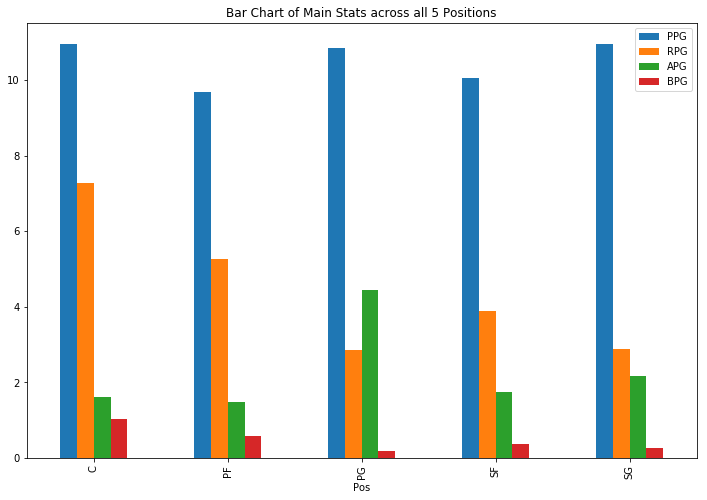

In [10]:
# Visualization 1 of 2:
bar_chart_df = summary_df[['PPG', 'RPG', 'APG', 'BPG']]
bar_chart_df.plot(kind='bar', figsize = (12, 8), title='Bar Chart of Main Stats across all 5 Positions')

#### This simple bar chart breaks down each position and plots each positions' averages for 4 main statistical categories: PPG, RPG, APG, and BPG.  We see what we expected to see, given the results of the above summary table: while PPG across positions remains pretty constant, RPG and APG fluctuate across positions.  I expect that the Feature Importance table will establish these two features, RPG and APG, as the two most important features when it comes to predicting a player's position.

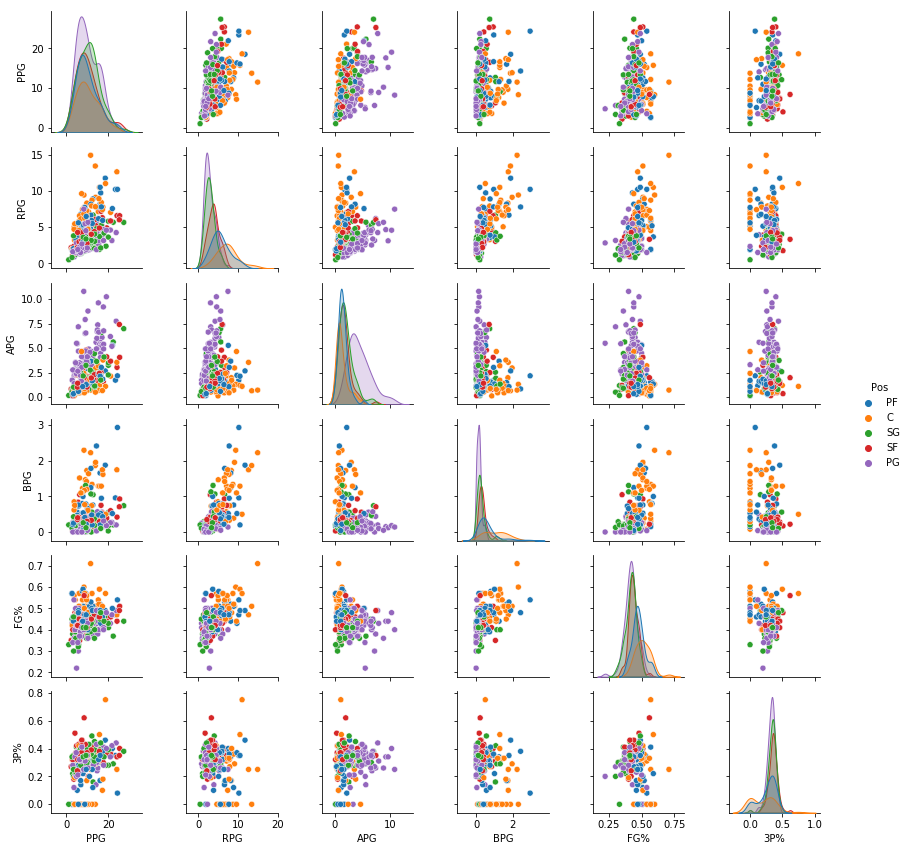

In [11]:
# Visualization 2 of 2:
sns_df = df[['PPG', 'RPG', 'APG', 'BPG', 'FG%', '3P%', 'Pos']].head(300)
sns_df = sns_df.reset_index()
sns_df = sns_df.drop('index', axis=1)

sns_plot = sns.pairplot(sns_df, hue='Pos', size=2)
sns_plot

#### This Seaborn-based visualization gives us scatter plots of all possible x/y-axis combinations.  The first thing I notice is that every graph seems to have a slight positive correlation - meaning, as the x-axis values increase, so do the y-values.  This makes sense to me, as it tells me that the better a player is at one particular category, chances are, they are also good at other statistical categories (good players don't just do one thing well).  Keeping with the APG vs. RPG, we see here that as RPG increases, APG do not tend to increase with it - likewise, as APG increases, RPG do not tend to increase with it.  This is because Centers/Power Forwards, who grab many rebounds because of their height, do not have the same role on offense as the smaller, more agile Point Guard, whose role is to distribute the ball and rack up assists.  

#### The diagonal gives us insight into the distribution of each variable, broken down by position - they help visualize the ranges in statistical categories by position.  Looking at the RPG vs. RPG intersection, for example, we can see that Centers have a longer tail than other positions, while for the APG metric, Point Guards have a longer tail than other positions - the longer tail indicates a wider distribution, a larger range of values).  While most categories have varied distributions, the PPG distribution remains relatively steady across all five positions.

# Decision Tree (1 of 3):
### This model will *not* use PCA transformation to reduce dimensions.  Decision Tree (2 of 3) *will* use PCA Transformation.

In [12]:
# New clean dataframe:
df_decision_tree1 = df.copy()
df_decision_tree1.head()

,PPG,RPG,ORPG,APG,SPG,BPG,FG%,FGA/GAME,TS%,3PA/GAME,3P%,2PA/GAME,2P%,FTA/GAME,FT%,FOULS/GAME,TOV/GAME,USG%,Pos
0,5.85,4.43,1.16,1.00,0.40,0.32,0.46,4.87,0.53,0.88,0.30,3.99,0.49,1.43,0.78,2.16,0.88,0.16,PF
2,7.67,7.47,2.84,0.94,0.54,1.23,0.54,5.70,0.55,0.03,0.00,5.67,0.55,2.93,0.50,3.17,1.41,0.14,C
4,13.27,3.17,0.35,1.65,0.53,0.09,0.42,11.33,0.53,4.27,0.35,7.06,0.47,2.54,0.84,2.14,1.49,0.19,SG
5,14.55,3.40,0.40,1.91,0.60,0.09,0.43,12.40,0.53,4.58,0.34,7.81,0.48,2.85,0.84,2.04,1.57,0.20,SG
6,10.56,2.68,0.24,1.12,0.36,0.08,0.41,9.08,0.53,3.60,0.40,5.48,0.42,1.88,0.85,2.36,1.32,0.17,SG


In [13]:
# Print shape of DataFrame:
print("Shape of DataFrame:", df_decision_tree1.shape)

Shape of DataFrame: (1087, 19)


In [14]:
# Set X (features) and y (target):
X = df_decision_tree1.drop('Pos', axis=1)
y = df_decision_tree1.loc[:, 'Pos']

In [15]:
# Check how many of each position in y-dataset:
y.value_counts()

PG    258
SG    240
SF    229
PF    218
C     142
Name: Pos, dtype: int64

In [16]:
# Manually encode y-labels to make it more meaningful for the confusion matrix during evaluation:
position_dictionary = {
    "C": 0,
    "PG": 1,
    "SG": 2,
    "SF": 3,
    "PF": 4}

y = y.map(position_dictionary).values.reshape(-1,1)

In [17]:
# Split X and y into X_train, X_test, y_train, y_test and check shape of each:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, stratify=y)
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)

X_train: (815, 18)
y_train: (815, 1)
X_test: (272, 18)
y_test: (272, 1)


In [18]:
# Scale X-data:
scaler = StandardScaler()
X_scaler = scaler.fit(X_train)

X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [19]:
# Instantiate, fit, and predict Decision Tree Model:
dt1_model = tree.DecisionTreeClassifier(random_state=78)
dt1_model = dt1_model.fit(X_train_scaled, y_train)
predictions = dt1_model.predict(X_test_scaled)

In [20]:
# Print accuracy score:
dt1_accuracy_score = accuracy_score(y_test, predictions)
dt1_accuracy_score

0.5220588235294118

In [21]:
# Print confusion matrix:
dt1_confusion_matrix = confusion_matrix(y_test, predictions)
print(dt1_confusion_matrix)

[[20  0  0  2 13]
 [ 0 53  9  3  0]
 [ 1 11 30 15  3]
 [ 2  6 16 20 13]
 [13  1  6 16 19]]


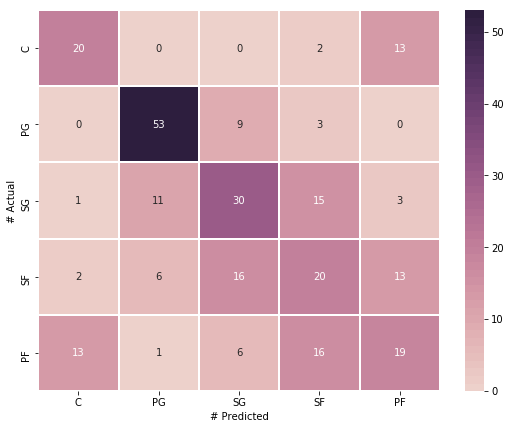

In [22]:
# Print second confusion matrix:

def confusion_matrix_heatmap(y_test, predictions):
    """This plots the above confusion matrix, but in a more meaningful way"""
    warnings.filterwarnings('ignore')

    cm = confusion_matrix(y_test, predictions)

    # Plot heatmap with numeric values in each cell:
    f, ax = plt.subplots(figsize=(9, 7))
    heat_map = sns.heatmap(cm, 
                           annot=True, 
                           fmt="d", 
                           linewidths=1, 
                           ax=ax, 
                           cmap=sns.cubehelix_palette(50),
                           xticklabels=position_dictionary.keys(), 
                           yticklabels=position_dictionary.keys())

    heat_map.set_xlabel("# Predicted")
    heat_map.set_ylabel("# Actual")
    
cm1 = confusion_matrix_heatmap(y_test, predictions)

#### The above confusion matrix does a good job of showing how accurate the model was at predicting player positions.  It concluded the following:
- Here
- Here

In [23]:
# Print classification report:
dt1_class_report = classification_report(y_test, predictions, target_names = ['PG', 'SG', 'SF', 'PF', 'C'])
print(dt1_class_report)

              precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.75      0.82      0.78        65
          SF       0.49      0.50      0.50        60
          PF       0.36      0.35      0.35        57
           C       0.40      0.35      0.37        55

    accuracy                           0.52       272
   macro avg       0.51      0.52      0.51       272
weighted avg       0.51      0.52      0.52       272



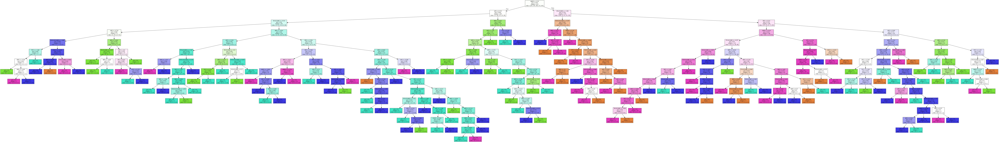

In [24]:
# Visualize Decision Tree:

dot_data = tree.export_graphviz(
    dt1_model, out_file=None, feature_names=X.columns, filled=True
)


graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [25]:
# Test model by making specific predictions, specifying my own hypothetical stats, to see if model correctly predicts position:
# Note that I encoded the "Position" column earlier so that the confusion matrix makes more sense during evaluation.
# Therefore, the result will spit out a number, corresponding to the following positions:
# C: 0
# PG: 1
# SG: 2
# SF: 3
# PF: 4

# Also keep in mind the order of the features:
# [PPG, RPG, ORPG, APG, SPG, BPG, FG%, FGA/Game, TS%, 3PA/Game, 3P%, 2PA/Game, 2P%, FTA/Game, FT%, Fouls/Game, TOV/Game, USG%]

# This hypothetical player, with the following made-up stats, I believe should be classified as a PG; 
# this is because I gave the player statistics similar to those of an above-average Point Guard.
pg_list = [[20, 3, 1, 10, 1.5, 0, .40, 14, .60, 6, .42, 8, .40, 8, .85, 3, 4, .15]]
pg_prediction = dt1_model.predict(pg_list)

# This hypothetical player, with the following made-up stats, I believe should be classified as a C; 
# this is because I gave the player statistics similar to those of an above-average Center.
c_list = [[15, 12, 7, 2, 1.5, 2.5, .70, 8, .80, 0, .0, 8, .70, 8, .65, 5, 2, .15]]
c_prediction = dt1_model.predict(c_list)

# This hypothetical player, with the following made-up stats, I believe should be classified as a SF; 
# this is because I gave the player statistics similar to those of an above-average Small Forward.
sf_list = [[17, 7, 4, 5, 1, .75, .50, 8, .60, 3, .37, 8, .50, 7, .75, 4, 3, .15]]
sf_prediction = dt1_model.predict(sf_list)

print(f'PG Prediction: {pg_prediction}\nC Predicition: {c_prediction}\nSF Prediction: {sf_prediction}')

PG Prediction: [1]
C Predicition: [0]
SF Prediction: [0]


#### Prediction 1: Correctly predicted as PG.
#### Prediction 2: Correctly predicted as C.
#### Prediction 3: Incorrectly predicted as C.  It makes the most sense that the SF prediction would be incorrect, as opposed to the PG or C prediction, because while Point Guards and Centers are specialized positions with specific roles, Small Forwards have a style of play that is a combination of Point Guards and Centers, and therefore their stats are naturally harder to predict.

In [26]:
# List features sorted in descending order by feature importance:
importances = pd.DataFrame(dt1_model.feature_importances_, index = X_train.columns, columns=['Importance']).sort_values('Importance', ascending=False)
importances.head()

,Importance
APG,0.186492
ORPG,0.130899
RPG,0.128567
3PA/GAME,0.088428
SPG,0.079916


#### The above Feature Importance list tells us what the model deems to be the most important features that most help determine positions: we see that APG, ORPG, and RPG are the most important features, as I predicted earlier.  We will use this Feature Importance table in the third Decision Tree, in which I will limit the target variables to just these three.

# Decision Tree (2 of 3):
### This model *will* use PCA transformation to reduce dimensions.

In [27]:
# New clean dataframe:
df2_decision_tree = df.copy()
df2_decision_tree.head()

,PPG,RPG,ORPG,APG,SPG,BPG,FG%,FGA/GAME,TS%,3PA/GAME,3P%,2PA/GAME,2P%,FTA/GAME,FT%,FOULS/GAME,TOV/GAME,USG%,Pos
0,5.85,4.43,1.16,1.00,0.40,0.32,0.46,4.87,0.53,0.88,0.30,3.99,0.49,1.43,0.78,2.16,0.88,0.16,PF
2,7.67,7.47,2.84,0.94,0.54,1.23,0.54,5.70,0.55,0.03,0.00,5.67,0.55,2.93,0.50,3.17,1.41,0.14,C
4,13.27,3.17,0.35,1.65,0.53,0.09,0.42,11.33,0.53,4.27,0.35,7.06,0.47,2.54,0.84,2.14,1.49,0.19,SG
5,14.55,3.40,0.40,1.91,0.60,0.09,0.43,12.40,0.53,4.58,0.34,7.81,0.48,2.85,0.84,2.04,1.57,0.20,SG
6,10.56,2.68,0.24,1.12,0.36,0.08,0.41,9.08,0.53,3.60,0.40,5.48,0.42,1.88,0.85,2.36,1.32,0.17,SG


In [28]:
# Print shape of DataFrame:
print("Shape of DataFrame:", df2_decision_tree.shape)

Shape of DataFrame: (1087, 19)


In [29]:
# Set X (features) and y (target):
X = df2_decision_tree.drop('Pos', axis=1)
y = df2_decision_tree.loc[:, 'Pos']

In [30]:
# Check how many of each position in y-dataset:
y.value_counts()

PG    258
SG    240
SF    229
PF    218
C     142
Name: Pos, dtype: int64

In [31]:
# Manually encode y-labels to make it more meaningful for the confusion matrix during evaluation:
position_dictionary = {
    "C": 0,
    "PG": 1,
    "SG": 2,
    "SF": 3,
    "PF": 4}

y = y.map(position_dictionary).values.reshape(-1,1)

In [32]:
# Scale X-data before using PCA to reduce dimensions:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [33]:
# Now, use PCA to reduce dimensions:
pca = PCA(n_components=4)

data_pca = pca.fit_transform(X_scaled)

X_pca = pd.DataFrame(data = data_pca, columns = ["PC1", "PC2", "PC3", "PC4"])
X_pca.head()

,PC1,PC2,PC3,PC4
0,-1.769876,1.231382,-0.108734,0.251679
1,0.590967,5.542105,1.517387,-0.677840
2,0.055908,-1.401636,-0.555867,0.574727
3,0.572232,-1.467328,-0.638066,0.628321
4,-1.045067,-1.424012,-0.359195,0.567987


In [34]:
pca.explained_variance_ratio_

array([0.38704938, 0.22428862, 0.11226277, 0.05875878])

#### According to the above Explained Variance Ratio, we have 78.2% of the information captured.  This is not ideal, but we will continue with the model and assess at end.

In [35]:
# Split the X and y into X_train, X_test, y_train, y_test and check shape of each:
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, random_state=1, stratify=y)
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)

X_train: (815, 4)
y_train: (815, 1)
X_test: (272, 4)
y_test: (272, 1)


In [36]:
# Instantiate, fit, and predict Random Forest Model:
dt2_model = tree.DecisionTreeClassifier(random_state=78)
dt2_model = dt2_model.fit(X_train, y_train)
predictions = dt2_model.predict(X_test)

In [37]:
# Print accuracy score:
dt2_accuracy_score = accuracy_score(y_test, predictions)
dt2_accuracy_score

0.48161764705882354

In [38]:
# Print confusion matrix:
dt2_confusion_matrix = confusion_matrix(y_test, predictions)
print(dt2_confusion_matrix)

[[18  1  0  1 15]
 [ 0 31 22 11  1]
 [ 1 11 29 13  6]
 [ 3  8 16 22  8]
 [ 7  2  3 12 31]]


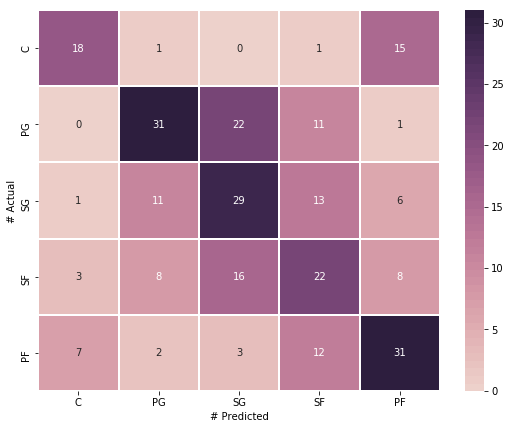

In [39]:
# Print second confusion matrix:

def confusion_matrix_heatmap(y_test, predictions):
    """This plots the above confusion matrix, but in a more meaningful way"""
    warnings.filterwarnings('ignore')

    cm = confusion_matrix(y_test, predictions)

    # Plot heatmap with numeric values in each cell:
    f, ax = plt.subplots(figsize=(9, 7))
    heat_map = sns.heatmap(cm, 
                           annot=True, 
                           fmt="d", 
                           linewidths=1, 
                           ax=ax, 
                           cmap=sns.cubehelix_palette(50),
                           xticklabels=position_dictionary.keys(), 
                           yticklabels=position_dictionary.keys())

    heat_map.set_xlabel("# Predicted")
    heat_map.set_ylabel("# Actual")
    
cm2 = confusion_matrix_heatmap(y_test, predictions)

#### The above confusion matrix does a good job of showing how accurate the model was at predicting player positions.  It concluded the following:
- Here
- Here

In [40]:
# Print classification report:
dt2_class_report = classification_report(y_test, predictions, target_names = ['PG', 'SG', 'SF', 'PF', 'C'])
print(dt2_class_report)

              precision    recall  f1-score   support

          PG       0.62      0.51      0.56        35
          SG       0.58      0.48      0.53        65
          SF       0.41      0.48      0.45        60
          PF       0.37      0.39      0.38        57
           C       0.51      0.56      0.53        55

    accuracy                           0.48       272
   macro avg       0.50      0.48      0.49       272
weighted avg       0.49      0.48      0.48       272



#### As the X-Data was PCA transformed in this model, a Feature Importance table cannot be run.  This is why we ran one for the first model, in which we did *not* PCA transform.

# Decision Tree Comparison:
### Compare Decision Tree Results (did PCA Transformation of the X-data improve or worsen model?)

In [41]:
print(f'Decision Tree 1 Accuracy Score (no PCA): {dt1_accuracy_score}. \nDecision Tree 2 Accuracy Score (with PCA): {dt2_accuracy_score}.')

Decision Tree 1 Accuracy Score (no PCA): 0.5220588235294118. 
Decision Tree 2 Accuracy Score (with PCA): 0.48161764705882354.


In [42]:
print(f'DT1 Class. Report (no PCA): {dt1_class_report}. \nDT2 Class. Report (with PCA): {dt2_class_report}.')

DT1 Class. Report (no PCA):               precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.75      0.82      0.78        65
          SF       0.49      0.50      0.50        60
          PF       0.36      0.35      0.35        57
           C       0.40      0.35      0.37        55

    accuracy                           0.52       272
   macro avg       0.51      0.52      0.51       272
weighted avg       0.51      0.52      0.52       272
. 
DT2 Class. Report (with PCA):               precision    recall  f1-score   support

          PG       0.62      0.51      0.56        35
          SG       0.58      0.48      0.53        65
          SF       0.41      0.48      0.45        60
          PF       0.37      0.39      0.38        57
           C       0.51      0.56      0.53        55

    accuracy                           0.48       272
   macro avg       0.50      0.48      0.49       272
weighted avg     

#### Based on the above results, it appears that the model *without* PCA transformation is a better model than the one *with* PCA transformation.
- 52.2% accuracy vs. 48.2% accuracy.
- 51% precision vs. 50% precision.
- 52% recall vs. 48% recall.
- 51% f1 score vs. 49% f1 score.

#### Mention results of confusion matrix also.

#### Therefore, in my third and final Decision Tree, I will *not* use PCA transformation.

# Decision Tree (3 of 3):
### This model will *only use* the top 3 features identified by Decision Tree 1's "Feature Importance" table, and based on the previous results, will *not* incorporate PCA transformation.

In [43]:
# First, remind ourselves what the first Decision Tree identified as the top 3 features:
importances.head(3)

,Importance
APG,0.186492
ORPG,0.130899
RPG,0.128567


#### Now, re-run the Decision Tree model without using PCA data transformation, only using these three features, as opposed to the 18 features used in the previous two models:

In [44]:
# New clean dataframe:
df_decision_tree3 = df.copy()
df_decision_tree3 = df_decision_tree3[['APG', 'ORPG', 'RPG', 'Pos']]
df_decision_tree3.head()

,APG,ORPG,RPG,Pos
0,1.00,1.16,4.43,PF
2,0.94,2.84,7.47,C
4,1.65,0.35,3.17,SG
5,1.91,0.40,3.40,SG
6,1.12,0.24,2.68,SG


In [45]:
# Print shape of DataFrame:
print("Shape of DataFrame:", df_decision_tree3.shape)

Shape of DataFrame: (1087, 4)


In [46]:
# Set X (features) and y (target):
X = df_decision_tree3.drop('Pos', axis=1)
y = df_decision_tree3.loc[:, 'Pos']

In [47]:
# Check how many of each position in y-dataset:
y.value_counts()

PG    258
SG    240
SF    229
PF    218
C     142
Name: Pos, dtype: int64

In [48]:
# Manually encode y-labels to make it more meaningful for the confusion matrix during evaluation:
position_dictionary = {
    "C": 0,
    "PG": 1,
    "SG": 2,
    "SF": 3,
    "PF": 4}

y = y.map(position_dictionary).values.reshape(-1,1)

In [49]:
# Split X and y into X_train, X_test, y_train, y_test and check shape of each:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, stratify=y)
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)

X_train: (815, 3)
y_train: (815, 1)
X_test: (272, 3)
y_test: (272, 1)


In [50]:
# Scale X-data:
scaler = StandardScaler()
X_scaler = scaler.fit(X_train)

X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [51]:
# Instantiate, fit, and predict Decision Tree Model:
dt3_model = tree.DecisionTreeClassifier(random_state=78)
dt3_model = dt3_model.fit(X_train_scaled, y_train)
predictions = dt3_model.predict(X_test_scaled)

In [52]:
# Print accuracy score:
dt3_accuracy_score = accuracy_score(y_test, predictions)
dt3_accuracy_score

0.5477941176470589

In [53]:
# Print confusion matrix:
dt3_confusion_matrix = confusion_matrix(y_test, predictions)
print(dt3_confusion_matrix)

[[20  0  3  2 10]
 [ 1 55  8  1  0]
 [ 1 11 28 15  5]
 [ 4  4 20 20  9]
 [10  0  7 12 26]]


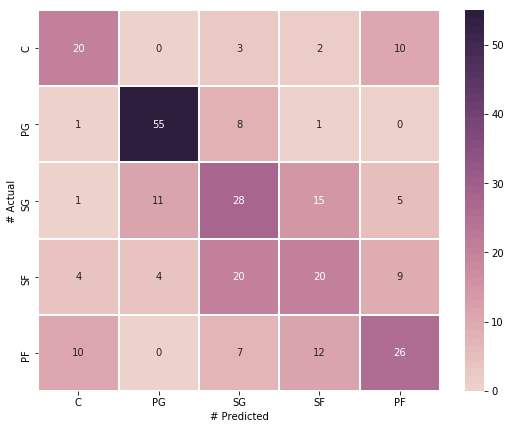

In [54]:
# Print second confusion matrix:

def confusion_matrix_heatmap(y_test, predictions):
    """This plots the above confusion matrix, but in a more meaningful way"""
    warnings.filterwarnings('ignore')

    cm = confusion_matrix(y_test, predictions)

    # Plot heatmap with numeric values in each cell:
    f, ax = plt.subplots(figsize=(9, 7))
    heat_map = sns.heatmap(cm, 
                           annot=True, 
                           fmt="d", 
                           linewidths=1, 
                           ax=ax, 
                           cmap=sns.cubehelix_palette(50),
                           xticklabels=position_dictionary.keys(), 
                           yticklabels=position_dictionary.keys())

    heat_map.set_xlabel("# Predicted")
    heat_map.set_ylabel("# Actual")
    
cm3 = confusion_matrix_heatmap(y_test, predictions)

#### The above confusion matrix does a good job of showing how accurate the model was at predicting player positions.  It concluded the following:
- Here
- Here

In [55]:
# Print classification report:
dt3_class_report = classification_report(y_test, predictions, target_names = ['PG', 'SG', 'SF', 'PF', 'C'])
print(dt3_class_report)

              precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.79      0.85      0.81        65
          SF       0.42      0.47      0.44        60
          PF       0.40      0.35      0.37        57
           C       0.52      0.47      0.50        55

    accuracy                           0.55       272
   macro avg       0.54      0.54      0.54       272
weighted avg       0.54      0.55      0.54       272



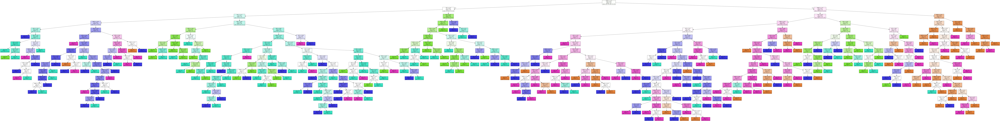

In [56]:
# Visualize Decision Tree:

dot_data = tree.export_graphviz(
    dt3_model, out_file=None, feature_names=X.columns, filled=True
)


graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [57]:
# Make same predictions as I did for first model:
# First model correctly predicted first and second position, but incorrectly predicted the third:

pg_list = [[10, 1, 3]]
c_list = [[2, 7, 12]]
sf_list = [[5, 4, 7]]

pg_prediction = dt3_model.predict(pg_list)
c_prediction = dt3_model.predict(c_list)
sf_prediction = dt3_model.predict(sf_list)

print(f'PG Prediction: {pg_prediction}\nC Predicition: {c_prediction}\nSF Prediction: {sf_prediction}')

PG Prediction: [1]
C Predicition: [0]
SF Prediction: [0]


#### Same results as first model: correctly predicted the Point Guard and Center, but incorrectly predicted the Small Forward.

### Compare the results of Decision Tree 3 to those of Decision Tree 1; did reducing features to the top 3 improve the model?

In [58]:
print(f'Decision Tree 1 Accuracy Score (all 18 features): {dt1_accuracy_score}. \nDecision Tree 3 Accuracy Score (top 3 features): {dt3_accuracy_score}.')

Decision Tree 1 Accuracy Score (all 18 features): 0.5220588235294118. 
Decision Tree 3 Accuracy Score (top 3 features): 0.5477941176470589.


In [59]:
print(f'DT1 Class. Report (all 18 features): {dt1_class_report}. \nDT3 Class. Report (top 3 features): {dt3_class_report}.')

DT1 Class. Report (all 18 features):               precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.75      0.82      0.78        65
          SF       0.49      0.50      0.50        60
          PF       0.36      0.35      0.35        57
           C       0.40      0.35      0.37        55

    accuracy                           0.52       272
   macro avg       0.51      0.52      0.51       272
weighted avg       0.51      0.52      0.52       272
. 
DT3 Class. Report (top 3 features):               precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.79      0.85      0.81        65
          SF       0.42      0.47      0.44        60
          PF       0.40      0.35      0.37        57
           C       0.52      0.47      0.50        55

    accuracy                           0.55       272
   macro avg       0.54      0.54      0.54       272
we

#### Based on the above results, it appears that the model that uses only 3 features is slightly better than the one that uses all 18:
- 54.8% accuracy vs. 52.2% accuracy.
- 54% precision vs. 51% precision.
- 54% recall vs. 52% recall.
- 54% f1 score vs. 51% f1 score.

#### Mention results of confusion matrix also.

# Final Decision Trees Conclusion:
#### After running the three Decision Tree Models, I achieved a max accuracy score of 54.8%.  This is not great, and can surely be improved a number of ways.  The first, and most obvious, solution would be to use a much larger dataset, with much more data (not just 3 seasons worth).  Another way to improve would have been to filter the DataFrame a little further, to remove players who were traded mid-season and therefore had multiple rows of data to specify with which team those stats were earned.

#### I was able to conclude that for this particular set of data, it was better *NOT* to PCA transform the X-data, and that it was better to only include the top 3 features of the data in the model (determined by a Feature Importance table) than to include all features.

# Random Forest:
### Based on the above conclusion (do *not* transform X-data using PCA and only use top 3 features in model), we will follow those rules for this model.

In [60]:
# New clean dataframe:
df_randomforest = df_decision_tree3.copy()
df_randomforest.head()

,APG,ORPG,RPG,Pos
0,1.00,1.16,4.43,PF
2,0.94,2.84,7.47,C
4,1.65,0.35,3.17,SG
5,1.91,0.40,3.40,SG
6,1.12,0.24,2.68,SG


In [61]:
# Print shape of DataFrame:
print("Shape of DataFrame:", df_randomforest.shape)

Shape of DataFrame: (1087, 4)


In [62]:
# Set X (features) and y (target):
X = df_randomforest.drop('Pos', axis=1)
y = df_randomforest.loc[:, 'Pos']

In [63]:
# Check how many of each position in y-dataset:
y.value_counts()

PG    258
SG    240
SF    229
PF    218
C     142
Name: Pos, dtype: int64

In [64]:
# Manually encode y-labels to make it more meaningful for the confusion matrix during evaluation:
position_dictionary = {
    "C": 0,
    "PG": 1,
    "SG": 2,
    "SF": 3,
    "PF": 4}

y = y.map(position_dictionary).values.reshape(-1,1)

In [65]:
# Split the X and y into X_train, X_test, y_train, y_test and check shape of each:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, stratify=y)
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)

X_train: (815, 3)
y_train: (815, 1)
X_test: (272, 3)
y_test: (272, 1)


In [66]:
# Scale X-data:
scaler = StandardScaler()
X_scaler = scaler.fit(X_train)

X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [67]:
# Instantiate, fit, and predict Random Forest Model:
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)
rf_model = rf_model.fit(X_train_scaled, y_train)
predictions = rf_model.predict(X_test_scaled)

In [68]:
rf_accuracy_score = accuracy_score(y_test, predictions)
rf_accuracy_score

0.5845588235294118

In [69]:
# Print confusion matrix:
rf_confusion_matrix = confusion_matrix(y_test, predictions)
print(rf_confusion_matrix)

[[20  0  1  2 12]
 [ 0 58  7  0  0]
 [ 0 10 34 11  5]
 [ 2  2 23 24  6]
 [11  0  5 16 23]]


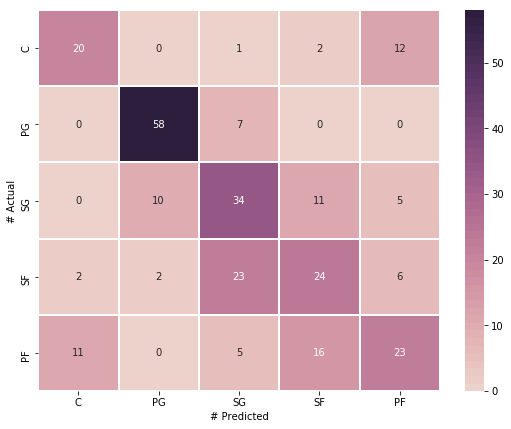

In [70]:
# Print second confusion matrix:

def confusion_matrix_heatmap(y_test, predictions):
    """This plots the above confusion matrix, but in a more meaningful way"""
    warnings.filterwarnings('ignore')

    cm = confusion_matrix(y_test, predictions)

    # Plot heatmap with numeric values in each cell:
    f, ax = plt.subplots(figsize=(9, 7))
    heat_map = sns.heatmap(cm, 
                           annot=True, 
                           fmt="d", 
                           linewidths=1, 
                           ax=ax, 
                           cmap=sns.cubehelix_palette(50),
                           xticklabels=position_dictionary.keys(), 
                           yticklabels=position_dictionary.keys())

    heat_map.set_xlabel("# Predicted")
    heat_map.set_ylabel("# Actual")
    
cm4 = confusion_matrix_heatmap(y_test, predictions)

#### The above confusion matrix does a good job of showing how accurate the model was at predicting player positions.  It concluded the following:
- Here
- Here

In [71]:
# Print classification report:
rf_class_report = classification_report(y_test, predictions, target_names = ['PG', 'SG', 'SF', 'PF', 'C'])
print(rf_class_report)

              precision    recall  f1-score   support

          PG       0.61      0.57      0.59        35
          SG       0.83      0.89      0.86        65
          SF       0.49      0.57      0.52        60
          PF       0.45      0.42      0.44        57
           C       0.50      0.42      0.46        55

    accuracy                           0.58       272
   macro avg       0.57      0.57      0.57       272
weighted avg       0.58      0.58      0.58       272



In [72]:
# Make same predictions as I did for other models:
# Other models correctly predicted first and second position, but incorrectly predicted the third:

pg_list = [[10, 1, 3]]
c_list = [[2, 7, 12]]
sf_list = [[5, 4, 7]]

pg_prediction = rf_model.predict(pg_list)
c_prediction = rf_model.predict(c_list)
sf_prediction = rf_model.predict(sf_list)

print(f'PG Prediction: {pg_prediction}\nC Predicition: {c_prediction}\nSF Prediction: {sf_prediction}')

PG Prediction: [1]
C Predicition: [0]
SF Prediction: [0]


#### Same results as other models: correctly predicted the Point Guard and Center, but incorrectly predicted the Small Forward.

### Compare the results of the Random Forest model to those of the best Decision Tree Model, Decision Tree 3; was the Random Forest model better?

In [73]:
print(f'Random Forest Accuracy Score: {rf_accuracy_score}. \nDecision Tree 3 Accuracy Score (top 3 features): {dt3_accuracy_score}.')

Random Forest Accuracy Score: 0.5845588235294118. 
Decision Tree 3 Accuracy Score (top 3 features): 0.5477941176470589.


In [74]:
print(f'RF Class. Report: {rf_class_report}. \nDT3 Class. Report: {dt3_class_report}.')

RF Class. Report:               precision    recall  f1-score   support

          PG       0.61      0.57      0.59        35
          SG       0.83      0.89      0.86        65
          SF       0.49      0.57      0.52        60
          PF       0.45      0.42      0.44        57
           C       0.50      0.42      0.46        55

    accuracy                           0.58       272
   macro avg       0.57      0.57      0.57       272
weighted avg       0.58      0.58      0.58       272
. 
DT3 Class. Report:               precision    recall  f1-score   support

          PG       0.56      0.57      0.56        35
          SG       0.79      0.85      0.81        65
          SF       0.42      0.47      0.44        60
          PF       0.40      0.35      0.37        57
           C       0.52      0.47      0.50        55

    accuracy                           0.55       272
   macro avg       0.54      0.54      0.54       272
weighted avg       0.54      0.55     

#### Based on the above results, it appears that the Random Forest model is better than the best Decision Tree model, Decision Tree 3:
- 58.5% accuracy vs. 54.8% accuracy.
- 57% precision vs. 54% precision.
- 57% recall vs. 54% recall.
- 57% f1 score vs. 54% f1 score.

#### Mention results of confusion matrix also.

# Final Decision Trees vs. Random Forest Conclusion:
#### After running the three Decision Tree Models, I achieved a max accuracy score of 54.8%.  The one Random Forest model I ran achieved a 58.5% accuracy.  Neither are great, and the ways to possibly improve this score is explained above.  All metrics were better for the Random Forest model.

#### Overall, I learned that with this particular type of data, it is not necessarily a good idea to PCA transform your X-data, and that it may be wise to limit your target variables to only the top 3-5, and not include less-important variables (determined by Feature Importance table).  I was able to conclude that for this particular set of data, it was better *NOT* to PCA transform the X-data, and that it was better to only include the top 3 features of the data in the model (determined by a Feature Importance table) than to include all features.

## K-Means Clustering:
### The above models all fall under "supervised" learning; this model falls under "unsupervised" learning

In [75]:
# # New clean dataframe:
# df_kmeans = df.copy()
# df_kmeans.head()

In [76]:
# # Encode "Pos" column using Label Encoder: I DONT EVEN THINK I SHOULD DO THIS BC ITS CLUSTERING AND THERE ISNT REALLY A Y TARGET COLUMN.  IF ANYTHING, DROP IT BC IT DOESNT MEAN ANYTHING.
# le = LabelEncoder()
# le.fit(df_kmeans['Pos'])
# df_kmeans['Pos'] = le.transform(df['Pos'])
# df_kmeans.head(10)

In [77]:
# # Before creating K-Means model, plot elbow curve to find best value for k (looks like we should use k=2):
# inertia = []
# k = list(range(1, 11))

# for i in k:
#     km = KMeans(n_clusters=i, random_state=0)
#     km.fit(df_kmeans)
#     inertia.append(km.inertia_)

# elbow_data = {"k": k, "inertia": inertia}
# df_elbow = pd.DataFrame(elbow_data)
# df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

In [78]:
# # Instantiate, fit, and predict K-Means Model (no need to use scale data as data is already on similiar scale):
# model = KMeans(n_clusters=2, max_iter=500, random_state=0)
# model = model.fit(df_kmeans)
# predictions = model.predict(df_kmeans)

In [79]:
# # Add predicted "classes" to the original dataframe:
# df_kmeans["class"] = model.labels_
# df_kmeans.head()

In [80]:
# Visualize Clusters, along with Cluster Centers (big yellow dots):
# d0=dfn[model == 0]
# d1=dfn[model == 1]
# d2=dfn[model == 2]
# d3=dfn[model == 3]
# d4=dfn[model == 4]

# plt.scatter(d0['XColumn'], d0['YColumn'], s = 10, c = 'blue', label = 'D0')
# plt.scatter(d1['XColumn'], d1['YColumn'], s = 10, c = 'green', label = 'D1')
# plt.scatter(d2['XColumn'], d2['YColumn'], s = 10, c = 'red', label = 'D2')
# plt.scatter(d3['XColumn'], d3['YColumn'], s = 10, c = 'purple', label = 'D3')
# plt.scatter(d4['XColumn'], d4['YColumn'], s = 10, c = 'orange', label = 'D4')

# plt.scatter(df['sepal length'], df['sepal width'], c=df['class'].apply(lambda x: colors[x]))

# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'yellow', label = 'Centroids')

#### Does the above cluster look like the graph we initially ran that shows those clusters?  If so, "Nice! It looks like our algorithm identified clusters (with centers signified by big yellow dots) that are mapped, at least somewhat closely, with the actual player position clusters."  Furthermore, given the overlapping clusters in our data, there does not seem to be any meaningful distinction in our AST/MP vs. TRB/MP data that would enable us to determine with any significant level of accuracy whether a player is a PF player or SG player. 

In [81]:
# # 3-D scatter plot comparing feature clusters (perhaps make a smaller DF, then do this):
# fig = px.scatter_3d(
#     df_kmeans,
#     x="BPG",
#     y="FG%",
#     z="3PA/GAME",
#     color="class",
#     symbol="class",
#     width=800,
# )
# fig.update_layout(legend=dict(x=0, y=1))
# fig.show()

### K-Means Clustering Conclusion:
What I expected was that the data would show clusters by position - this being because the position you play is the biggest factor in terms of what statistical ouput you are likely to produce (for example, Centers will average much fewer 3PA/Game than, say, Shooting Guards).

## Now, let's take my best model from above, XYZ, and use it with a different, larger, dataset.  Does a more thorough dataset improve the model?